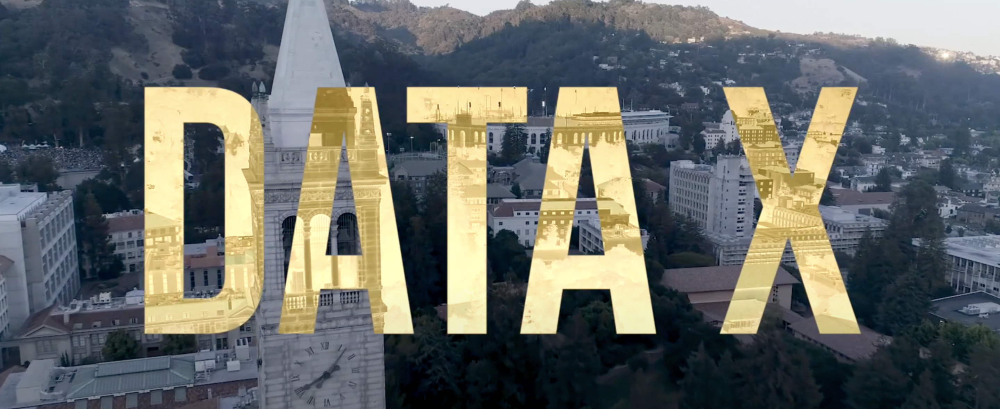

**UC Berkeley**

**Institution**: Sutardja Center for Entreprenurship & Technology (SCET)

**Course**: Data-X (INDENG 135 / 235)

**Semester**: Fall 2021

**Template Authors & Reviewers**: Ruiqi Guo, Mahan Tajrobehkar, Mario Filho, Ikhlaq Sidhu, & Derek S. Chan

**Updated**: Saturday, 9/25/2021, 7:00am PST

-----

**Student Author**: Ritik Batra

**Updated**: October 1, 2021


**Homework objectives**: 
* Read in project team’s dataset and carry out data cleaning by referencing [week 2](https://github.com/scetx/datax/blob/master/01-data-x-fundamentals/m125-dataset-initial-checks/m125_Dataset_Diversity_Quality_Quantity.ipynb), [week 3](https://github.com/scetx/datax/blob/master/01-data-x-fundamentals/m141-defining-success/m141_Precision_Recall_Threshold.ipynb) and [week5](https://github.com/scetx/datax/blob/master/01-data-x-fundamentals/m160-titanic/nb-m160-titanic.ipynb) notebooks. Additional resources are week 2 introductions to [Pandas](https://github.com/scetx/datax/blob/master/01-data-x-fundamentals/m120-pandas/pandas-B/m120_pandas-intro.ipynb) and [Numpy](https://github.com/scetx/datax/blob/master/01-data-x-fundamentals/m110-numpy/numpy-B/nb-m110-numpy-intro.ipynb).
* Inform the 3 or more data check or update methods applied in the data cleaning section.
* Train a model with the cleaned dataset based on H2O.ai's [Driverless AI](https://h2oai.github.io/tutorials/automatic-ml-intro-with-driverless-ai/#0). Take the screenshot of results on the testing dataset, and add the image to the correponding position of this notebook. 
* Answer the 3 questions in complete sentences at the summary section.
* Record a video log to walk through this notebook and explain the answers to 3 questions, taking no longer than 90 seconds.
*  Create a subfolder [First and Last Name] in a [week 6 folder](https://drive.google.com/drive/folders/1tusu0LNiSJcHJqSIQKbBMHD_gxS2J_s9?usp=sharing), restricting access to GSIs and faculty (ruiqiguo@berkeley.edu, mahan_tajrobehkar@berkeley.edu, sidhu@berkeley.edu, derekschan@berkeley.edu). The folder should include your video log, original dataset, and Jupyter or Colab notebook to allow GSIs to grade.

# 1: Data read-in and cleaning (required)





Student should read in the dataset in this part and carry out data cleaning in the subsections, the data cleaning choices can vary according to the specific selected dataset.

## 1.1 Data check/update step 1: Import required modules and load dataset directories






In [1]:
# Necessary import statements
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import seaborn as sns

from sklearn.model_selection import TimeSeriesSplit
import sklearn.metrics as metrics

### Plan
This data was labeled and provided by the Department of Transportation (DOT) and its owner is the NYC OpenData. Our goal is to group together roads by ID and eliminate the unnecessary columns and then view the counts under each time. We are going to divide the data into a train/test set as well of 80%/20% which is pretty aligned with ML standards. In this case, we will split by 5 years for training and 1 for testing (2019).

Here we have the dataset we will be exploring, the Traffic Volume Counts in NYC from 2014-2019. Our goal is to uncover  at what time will an area have the most congestion. That will help us uncover where we should be having more public transportation available at a time.

In [2]:
# First import the data from csv we got from 
# https://data.cityofnewyork.us/Transportation/Traffic-Volume-Counts-2014-2019-/ertz-hr4r/data 
data = pd.read_csv('traffic_data.csv')
data

,ID,Segment ID,Roadway Name,From,To,Direction,Date,12:00-1:00 AM,1:00-2:00AM,2:00-3:00AM,...,2:00-3:00PM,3:00-4:00PM,4:00-5:00PM,5:00-6:00PM,6:00-7:00PM,7:00-8:00PM,8:00-9:00PM,9:00-10:00PM,10:00-11:00PM,11:00-12:00AM
0,2,70376,3 Avenue,East 154 Street,East 155 Street,NB,09/13/2014,204,177,133,...,520,611,573,546,582,528,432,328,282,240
1,2,70376,3 Avenue,East 155 Street,East 154 Street,SB,09/13/2014,140,51,128,...,379,376,329,362,418,335,282,247,237,191
2,56,176365,Bedford Park Boulevard,Grand Concourse,Valentine Avenue,EB,09/13/2014,94,73,65,...,280,272,264,236,213,190,199,183,147,103
3,56,176365,Bedford Park Boulevard,Grand Concourse,Valentine Avenue,WB,09/13/2014,88,82,75,...,237,276,223,240,217,198,186,162,157,103
4,62,147673,Broadway,West 242 Street,240 Street,SB,09/13/2014,255,209,149,...,732,809,707,675,641,556,546,465,425,324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27284,371,37916,3 Avenue,East 99 Street,East 100 Street,NB,10/16/2019,297,155,162,...,405,577,468,466,259,352,367,330,285,254
27285,371,37916,3 Avenue,East 99 Street,East 100 Street,NB,10/17/2019,181,107,78,...,411,440,679,729,432,477,506,460,398,388
27286,371,37916,3 Avenue,East 99 Street,East 100 Street,NB,10/18/2019,248,161,115,...,460,693,868,807,544,487,423,400,336,313
27287,371,37916,3 Avenue,East 99 Street,East 100 Street,NB,10/19/2019,251,195,132,...,400,434,421,407,374,361,356,391,450,495


In [3]:
# Expose the columns
data.columns

Index(['ID', 'Segment ID', 'Roadway Name', 'From', 'To', 'Direction', 'Date',
       '12:00-1:00 AM', '1:00-2:00AM', '2:00-3:00AM', '3:00-4:00AM',
       '4:00-5:00AM', '5:00-6:00AM', '6:00-7:00AM', '7:00-8:00AM',
       '8:00-9:00AM', '9:00-10:00AM', '10:00-11:00AM', '11:00-12:00PM',
       '12:00-1:00PM', '1:00-2:00PM', '2:00-3:00PM', '3:00-4:00PM',
       '4:00-5:00PM', '5:00-6:00PM', '6:00-7:00PM', '7:00-8:00PM',
       '8:00-9:00PM', '9:00-10:00PM', '10:00-11:00PM', '11:00-12:00AM'],
      dtype='object')

In [4]:
# Get some general data statistics
data.describe(include='all')

,ID,Segment ID,Roadway Name,From,To,Direction,Date,12:00-1:00 AM,1:00-2:00AM,2:00-3:00AM,...,2:00-3:00PM,3:00-4:00PM,4:00-5:00PM,5:00-6:00PM,6:00-7:00PM,7:00-8:00PM,8:00-9:00PM,9:00-10:00PM,10:00-11:00PM,11:00-12:00AM
count,27289.000000,2.728900e+04,27289,27289,27289,27289,27289,27285,27285,27285,...,27289,27289,27289,27289,27289,27289,27289,27289,27289,27289
unique,NaN,NaN,889,1123,1140,4,422,2095,1687,1413,...,3358,3397,3432,3380,3398,3251,3070,2860,2695,2465
top,NaN,NaN,Broadway,Dead End,Dead End,NB,10/12/2019,43,32,22,...,316,276,354,309,287,214,176,127,109,86
freq,NaN,NaN,387,504,387,7998,391,151,212,288,...,63,60,56,54,62,65,78,94,95,125
mean,178.367584,6.460915e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,107.494863,2.155932e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,2.020000e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,85.000000,3.504100e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,172.000000,8.169400e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,272.000000,1.481960e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
# Data frame information (null, data type)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27289 entries, 0 to 27288
Data columns (total 31 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   ID             27289 non-null  int64 
 1   Segment ID     27289 non-null  int64 
 2   Roadway Name   27289 non-null  object
 3   From           27289 non-null  object
 4   To             27289 non-null  object
 5   Direction      27289 non-null  object
 6   Date           27289 non-null  object
 7   12:00-1:00 AM  27285 non-null  object
 8   1:00-2:00AM    27285 non-null  object
 9   2:00-3:00AM    27285 non-null  object
 10  3:00-4:00AM    27285 non-null  object
 11  4:00-5:00AM    27285 non-null  object
 12  5:00-6:00AM    27285 non-null  object
 13  6:00-7:00AM    27285 non-null  object
 14  7:00-8:00AM    27285 non-null  object
 15  8:00-9:00AM    27285 non-null  object
 16  9:00-10:00AM   27285 non-null  object
 17  10:00-11:00AM  27286 non-null  object
 18  11:00-12:00PM  27288 non-n

### Highlights + Labels
* Consists of 27k+ total entries over the course of 5 years
* ID is a unique identifier for a specific from-to street which makes it easy to track
* Direction is WB/SB/NB/EB to indicate which direction-bound we are observing
* We have counts for each hour of that day

In [6]:
# Eliminate any unnecessary columns that we don't need
dropped_cols = ["Segment ID", "Roadway Name", "From", "To"]
data = data.drop(columns=dropped_cols)
data

,ID,Direction,Date,12:00-1:00 AM,1:00-2:00AM,2:00-3:00AM,3:00-4:00AM,4:00-5:00AM,5:00-6:00AM,6:00-7:00AM,...,2:00-3:00PM,3:00-4:00PM,4:00-5:00PM,5:00-6:00PM,6:00-7:00PM,7:00-8:00PM,8:00-9:00PM,9:00-10:00PM,10:00-11:00PM,11:00-12:00AM
0,2,NB,09/13/2014,204,177,133,126,141,134,121,...,520,611,573,546,582,528,432,328,282,240
1,2,SB,09/13/2014,140,51,128,116,144,146,153,...,379,376,329,362,418,335,282,247,237,191
2,56,EB,09/13/2014,94,73,65,61,64,73,65,...,280,272,264,236,213,190,199,183,147,103
3,56,WB,09/13/2014,88,82,75,60,65,67,71,...,237,276,223,240,217,198,186,162,157,103
4,62,SB,09/13/2014,255,209,149,148,128,136,199,...,732,809,707,675,641,556,546,465,425,324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27284,371,NB,10/16/2019,297,155,162,119,147,254,455,...,405,577,468,466,259,352,367,330,285,254
27285,371,NB,10/17/2019,181,107,78,66,90,140,268,...,411,440,679,729,432,477,506,460,398,388
27286,371,NB,10/18/2019,248,161,115,88,135,159,229,...,460,693,868,807,544,487,423,400,336,313
27287,371,NB,10/19/2019,251,195,132,109,106,106,133,...,400,434,421,407,374,361,356,391,450,495


In [7]:
# We will want to get the year out so we can group into test and train datasets. We also want to combine the IDs 
# together as we are focusing on congestion in area rather than a specific 

data['year'] = data['Date'].apply(lambda row: row[-4:])
data

,ID,Direction,Date,12:00-1:00 AM,1:00-2:00AM,2:00-3:00AM,3:00-4:00AM,4:00-5:00AM,5:00-6:00AM,6:00-7:00AM,...,3:00-4:00PM,4:00-5:00PM,5:00-6:00PM,6:00-7:00PM,7:00-8:00PM,8:00-9:00PM,9:00-10:00PM,10:00-11:00PM,11:00-12:00AM,year
0,2,NB,09/13/2014,204,177,133,126,141,134,121,...,611,573,546,582,528,432,328,282,240,2014
1,2,SB,09/13/2014,140,51,128,116,144,146,153,...,376,329,362,418,335,282,247,237,191,2014
2,56,EB,09/13/2014,94,73,65,61,64,73,65,...,272,264,236,213,190,199,183,147,103,2014
3,56,WB,09/13/2014,88,82,75,60,65,67,71,...,276,223,240,217,198,186,162,157,103,2014
4,62,SB,09/13/2014,255,209,149,148,128,136,199,...,809,707,675,641,556,546,465,425,324,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27284,371,NB,10/16/2019,297,155,162,119,147,254,455,...,577,468,466,259,352,367,330,285,254,2019
27285,371,NB,10/17/2019,181,107,78,66,90,140,268,...,440,679,729,432,477,506,460,398,388,2019
27286,371,NB,10/18/2019,248,161,115,88,135,159,229,...,693,868,807,544,487,423,400,336,313,2019
27287,371,NB,10/19/2019,251,195,132,109,106,106,133,...,434,421,407,374,361,356,391,450,495,2019


In [8]:
# Rename columns to hour of the day as it is easier to call and we can also convert our data to numeric from string
times_conv = {}
hour = 0
for col in data.columns:
    if "-" in col:
        times_conv[col] = hour
        hour += 1
print(times_conv)

data = data.rename(columns=times_conv)
data

{'12:00-1:00 AM': 0, '1:00-2:00AM': 1, '2:00-3:00AM': 2, '3:00-4:00AM': 3, '4:00-5:00AM': 4, '5:00-6:00AM': 5, '6:00-7:00AM': 6, '7:00-8:00AM': 7, '8:00-9:00AM': 8, '9:00-10:00AM': 9, '10:00-11:00AM': 10, '11:00-12:00PM': 11, '12:00-1:00PM': 12, '1:00-2:00PM': 13, '2:00-3:00PM': 14, '3:00-4:00PM': 15, '4:00-5:00PM': 16, '5:00-6:00PM': 17, '6:00-7:00PM': 18, '7:00-8:00PM': 19, '8:00-9:00PM': 20, '9:00-10:00PM': 21, '10:00-11:00PM': 22, '11:00-12:00AM': 23}


,ID,Direction,Date,0,1,2,3,4,5,6,...,15,16,17,18,19,20,21,22,23,year
0,2,NB,09/13/2014,204,177,133,126,141,134,121,...,611,573,546,582,528,432,328,282,240,2014
1,2,SB,09/13/2014,140,51,128,116,144,146,153,...,376,329,362,418,335,282,247,237,191,2014
2,56,EB,09/13/2014,94,73,65,61,64,73,65,...,272,264,236,213,190,199,183,147,103,2014
3,56,WB,09/13/2014,88,82,75,60,65,67,71,...,276,223,240,217,198,186,162,157,103,2014
4,62,SB,09/13/2014,255,209,149,148,128,136,199,...,809,707,675,641,556,546,465,425,324,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27284,371,NB,10/16/2019,297,155,162,119,147,254,455,...,577,468,466,259,352,367,330,285,254,2019
27285,371,NB,10/17/2019,181,107,78,66,90,140,268,...,440,679,729,432,477,506,460,398,388,2019
27286,371,NB,10/18/2019,248,161,115,88,135,159,229,...,693,868,807,544,487,423,400,336,313,2019
27287,371,NB,10/19/2019,251,195,132,109,106,106,133,...,434,421,407,374,361,356,391,450,495,2019


In [9]:
# Convert all data to numeric (as data cleaning) and remove unnecessary commas to more easily convert
data = data.replace(',','', regex=True)
hours = [x for x in range(24)]
data[hours] = data[hours].apply(pd.to_numeric)
data.head(5)

,ID,Direction,Date,0,1,2,3,4,5,6,...,15,16,17,18,19,20,21,22,23,year
0,2,NB,09/13/2014,204.0,177.0,133.0,126.0,141.0,134.0,121.0,...,611,573,546,582,528,432,328,282,240,2014
1,2,SB,09/13/2014,140.0,51.0,128.0,116.0,144.0,146.0,153.0,...,376,329,362,418,335,282,247,237,191,2014
2,56,EB,09/13/2014,94.0,73.0,65.0,61.0,64.0,73.0,65.0,...,272,264,236,213,190,199,183,147,103,2014
3,56,WB,09/13/2014,88.0,82.0,75.0,60.0,65.0,67.0,71.0,...,276,223,240,217,198,186,162,157,103,2014
4,62,SB,09/13/2014,255.0,209.0,149.0,148.0,128.0,136.0,199.0,...,809,707,675,641,556,546,465,425,324,2014


## 1.2 Data check/update step 2: Split up into Train/Test + Data Preprocessing

In [10]:
# Show your work!

# Split into train and test based on the year -- we no longer need year now
train = data[data["year"].astype(int) < 2019]
test = data[data["year"].astype(int) == 2019]
train=train.drop(columns="year")
test=test.drop(columns="year")
len(train), len(test)

(21448, 5841)

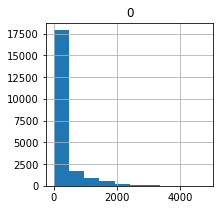

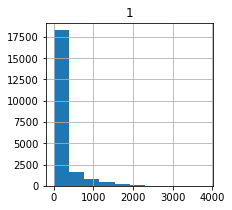

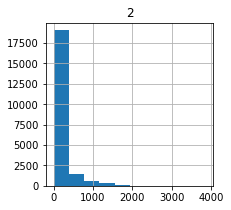

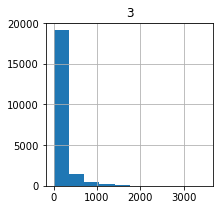

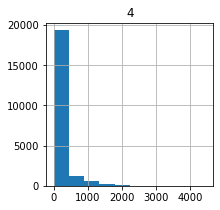

...

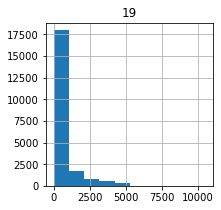

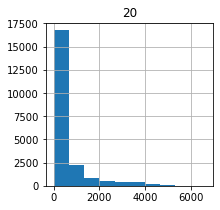

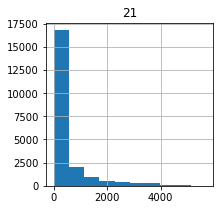

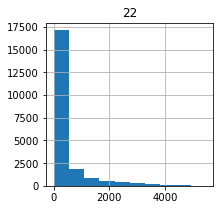

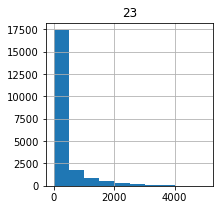

In [11]:
# Explore some histograms to show the distribution for every hour

for hour in range(24):
    train.hist(figsize=(3,3), column=hour)
    plt.show()

We can see that there is a heavy skew to the right in for all these hours which makes sense since most of the day we can assume that there is less congestion

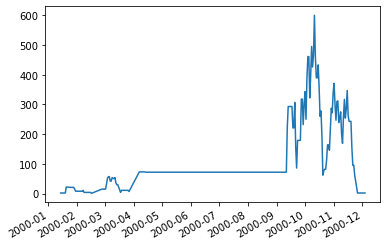

In [12]:
# Explore if dates are balanced and then convert string of dates to datetime

train['day'] = train["Date"].apply(lambda row: datetime.strptime(row[:-2]+"00", "%m/%d/%Y"))
value_count = train['day'].value_counts()
value_count.sort_index().plot()

train['Date'] = train["Date"].apply(lambda row: datetime.strptime(row, "%m/%d/%Y"))
test['Date'] = test["Date"].apply(lambda row: datetime.strptime(row, "%m/%d/%Y"))
train = train.drop("day", axis=1)

**Note:** We can see that the data heavily biases the tail end of the year so we may decide to focus on just September to December in the future. We would need more data year round in general.

In [13]:
# Show training dataset
train

,ID,Direction,Date,0,1,2,3,4,5,6,...,14,15,16,17,18,19,20,21,22,23
0,2,NB,2014-09-13,204.0,177.0,133.0,126.0,141.0,134.0,121.0,...,520,611,573,546,582,528,432,328,282,240
1,2,SB,2014-09-13,140.0,51.0,128.0,116.0,144.0,146.0,153.0,...,379,376,329,362,418,335,282,247,237,191
2,56,EB,2014-09-13,94.0,73.0,65.0,61.0,64.0,73.0,65.0,...,280,272,264,236,213,190,199,183,147,103
3,56,WB,2014-09-13,88.0,82.0,75.0,60.0,65.0,67.0,71.0,...,237,276,223,240,217,198,186,162,157,103
4,62,SB,2014-09-13,255.0,209.0,149.0,148.0,128.0,136.0,199.0,...,732,809,707,675,641,556,546,465,425,324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21490,366,EB,2018-04-15,149.0,81.0,59.0,45.0,42.0,37.0,54.0,...,256,320,291,266,256,251,228,202,197,154
21491,366,WB,2018-04-15,169.0,95.0,86.0,56.0,45.0,59.0,98.0,...,523,465,531,436,446,374,311,289,273,170
21492,367,NB,2018-04-15,415.0,339.0,239.0,185.0,212.0,158.0,138.0,...,631,618,520,564,455,481,425,404,317,280
21493,367,SB,2018-04-15,347.0,276.0,225.0,191.0,254.0,210.0,216.0,...,527,521,519,466,493,495,401,391,309,270


## 1.3 Data check/update step 3: Exploration + Visualization + Hypothesis


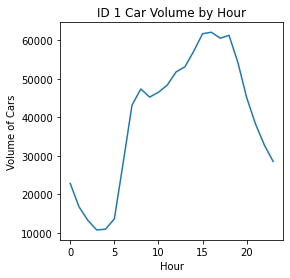

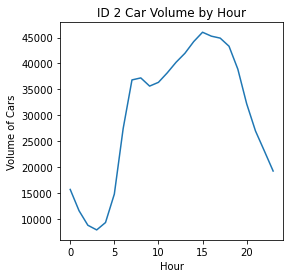

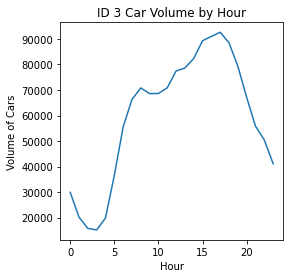

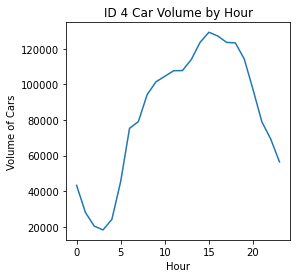

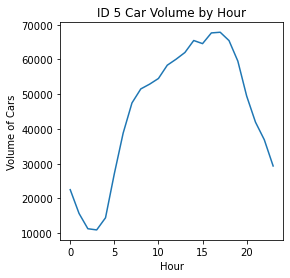

...

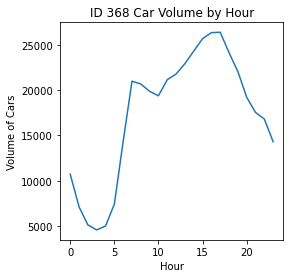

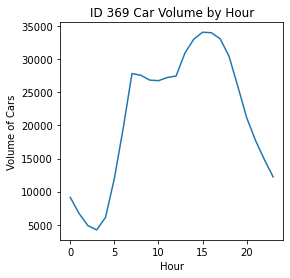

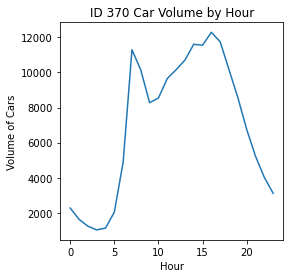

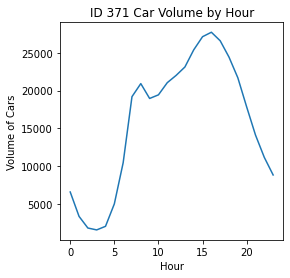

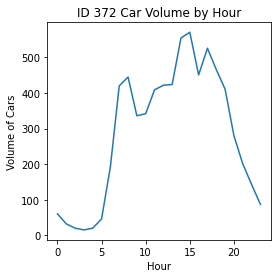

In [14]:
# Show your work!

# We should visualize a specific location and explore the time series of how crowded it gets
# Let's do it for every ID (1-372)
for uid in range(1,373):
    plt.xlabel("Hour")
    plt.ylabel("Volume of Cars")
    plt.title("ID %d Car Volume by Hour" % uid)
    train[[hr for hr in range(24)]][train['ID'] == uid].sum().plot(figsize=(4,4))
    plt.show()

All of the graphs above follow a similar pattern where they dip around 4-6AM and increase to its peak from 3-6PM ish (rushhour). My hypothesis is that the mid-afternoon will be the peak for most of these areas, but I'm curious how each area differs as this graph just shows the total of all the area congestion. I'm also curious if location is even helpful -- does adding location id to the model improve the accuracy or is it the same (that means that the time that has the most congestion is the same across all locations).

/Users/ritikbatra/opt/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/core.py:337: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


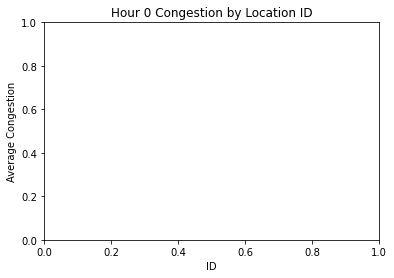

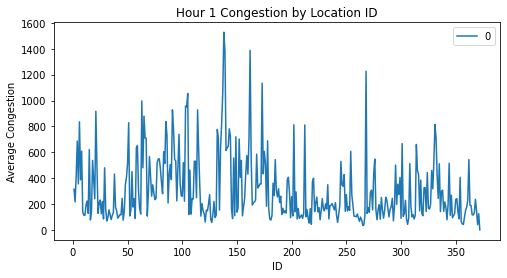

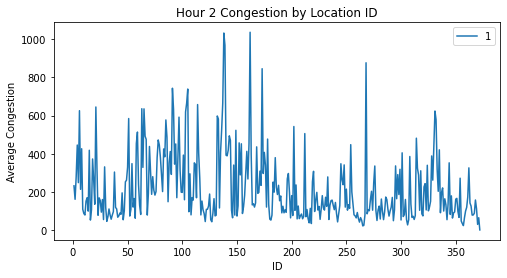

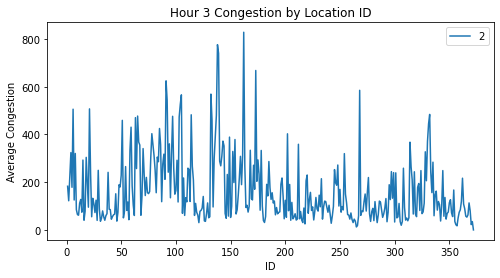

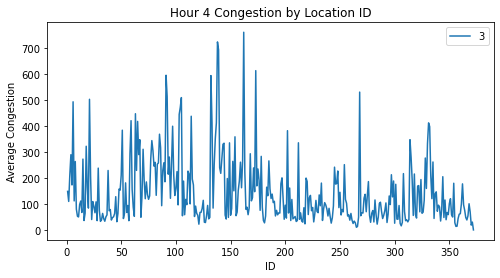

...

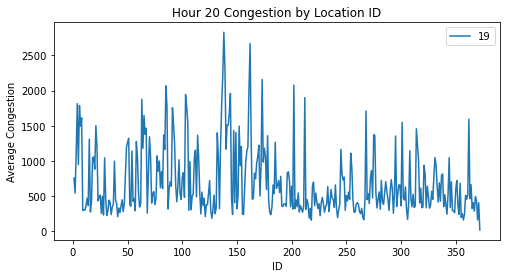

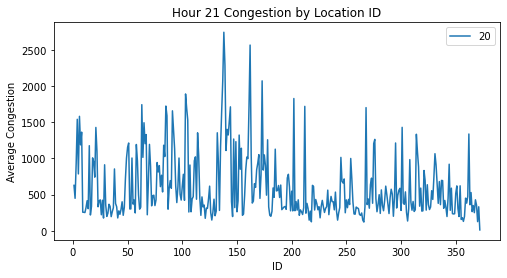

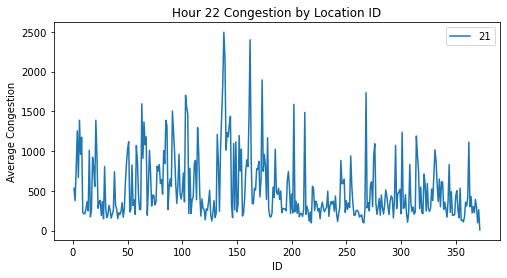

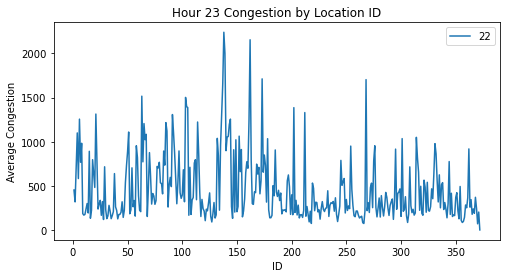

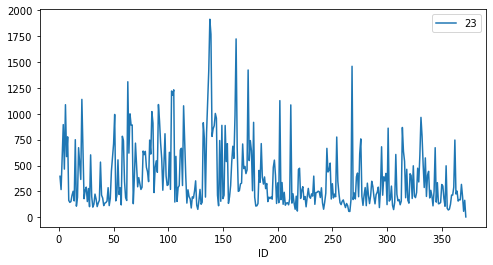

In [15]:
# We want to now observe what the average congestion is per hour for each ID
avg_train = train[["ID"] + [hr for hr in range(24)]].groupby("ID").mean()
for hr in range(24):
    plt.xlabel("ID")
    plt.ylabel("Average Congestion")
    plt.title("Hour %d Congestion by Location ID" % hr)
    avg_train[[hr]].plot(figsize=(8,4))

In [16]:
# We also want to just see what the average congestion is per ID
avg_train["avg"] = avg_train[[hr for hr in range(24)]].mean(axis=1)
avg_train["avg"]

ID
1       552.075810
2       420.414352
3       828.707755
4      1327.257937
5       711.453704
          ...     
368     386.920370
369     356.843056
370     129.651235
371     297.036147
372      11.017628
Name: avg, Length: 372, dtype: float64

The information above helps us see which areas just have more congestion in general which will help us know how to direction public transportationa s a whole

In [17]:
# Create a new column with the highest congestion. This is going to be our target column
train["outcome"] = train[[hr for hr in range(24)]].idxmax(axis=1)
test["outcome"] = test[[hr for hr in range(24)]].idxmax(axis=1)

<AxesSubplot:title={'center':'Histogram of most congested hours'}, xlabel='Hour of Day', ylabel='Count'>

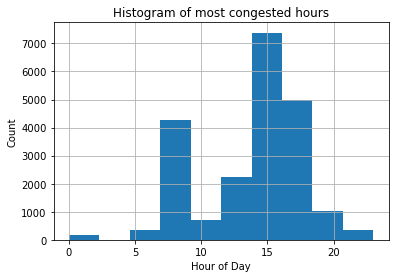

In [18]:
plt.xlabel("Hour of Day")
plt.ylabel("Count")
plt.title("Histogram of most congested hours")
train["outcome"].hist()

This histogram above shows us that 3PM is the most common time of day, but we have some areas that are more congested in the morning hour so this proves that this is an interesting model to check because it could be interesting to see which areas are more congested in contrast to others. Our goal is to be able to model and predict based on the id, what time is most congested and do we need more public transporation for that area.

In [19]:
# Convert train and test data to csv
train.to_csv("train.csv")
test.to_csv("test.csv")

# 2: H2O result screenshot (required)


Extra resources: https://h2oai.github.io/tutorials/ -> 
* Introduction & structured data: https://h2oai.github.io/tutorials/automatic-ml-intro-with-driverless-ai/#0 
* Text data: https://h2oai.github.io/tutorials/natural-language-processing-sentiment-analysis/#0
* Image data: https://h2oai.github.io/tutorials/image-processing-in-driverless-ai/#0

Below is one valid screenshot example, with your username shown

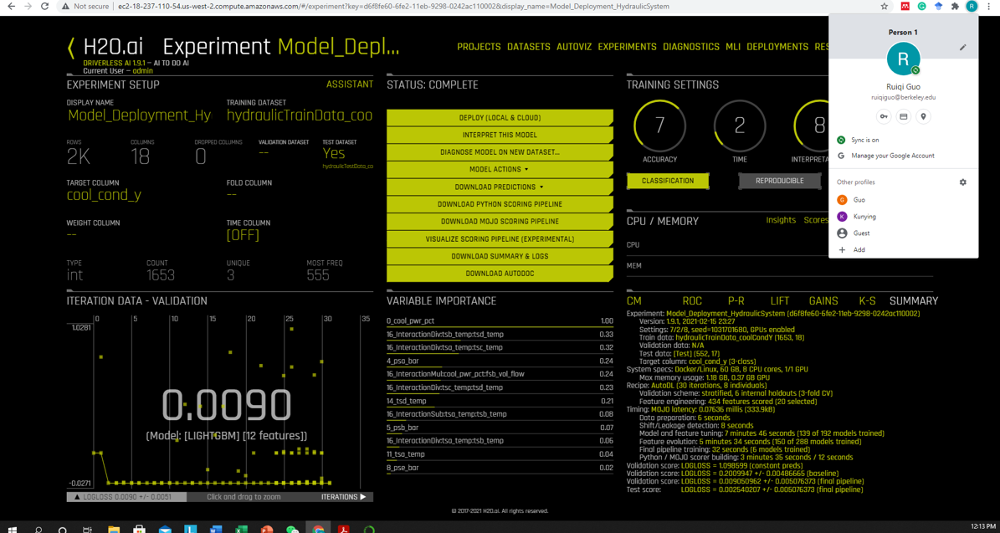

### Screenshot of the result of my experiment on H2O_ai

![](experiment.png)

### Here is the screenshot of my model on test_data

![](test_run.png)

# 3 Try your own approach (required)
Compare or validate vs. H2O.ai

In [20]:
# Show your work!

In [21]:
# Add import statements for ML
from sklearn import model_selection
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from math import sqrt

In [22]:
# We are first going to sort by date and then convert the dates into floats (numeric)
# Then we want to remove any rows that have na values
# our goal is to create a random forest to test against the h20ai and see if a random forest
# performs better than a typical time series model. A random forest in this situation doesn't make
# the most sense since we want to explore which days have the highest congestion and we also aren't accounting
# for direction. This will be a future modification to make sure we are accounting for these.

# We want to use feature engineering to convert the information we have into numeric data so that our model can digest it
# but the challenge that we have is whether something is quantitative or qualitative data. In our case, the ID is
# qualitative. We are treating it as quantitative for the sake of this model, but in the future we should be focusing
# on the other features as numeric instead. Since we are using random forest, we can use the ID because it helps us
# break down the times that are most congested for a certain time for a specific id location.

train_no_na = train.dropna().sort_values(by=['Date'])
train_no_na["Date"] = train_no_na["Date"].apply(lambda row: row.timestamp())
test_no_na = test.dropna().sort_values(by=["Date"])
test_no_na["Date"] = test_no_na["Date"].apply(lambda row: row.timestamp())

columns = ["Date", "ID"] + [hr for hr in range(24)]
x_train = train_no_na[columns].values
y_train = train_no_na["outcome"]

x_test = test_no_na[columns].values
y_test = test_no_na["outcome"]

x_train, y_train

(array([[1.4105664e+09, 2.0000000e+00, 2.0400000e+02, ..., 3.2800000e+02,
         2.8200000e+02, 2.4000000e+02],
        [1.4105664e+09, 2.2700000e+02, 2.3100000e+02, ..., 3.1800000e+02,
         3.7000000e+02, 3.2800000e+02],
        [1.4105664e+09, 2.2700000e+02, 1.8600000e+02, ..., 3.4400000e+02,
         3.4600000e+02, 2.4300000e+02],
        ...,
        [1.5237504e+09, 3.4200000e+02, 1.4000000e+01, ..., 1.6000000e+01,
         1.3000000e+01, 8.0000000e+00],
        [1.5237504e+09, 3.4900000e+02, 1.0100000e+02, ..., 1.4600000e+02,
         9.0000000e+01, 5.5000000e+01],
        [1.5237504e+09, 3.6800000e+02, 1.0250000e+03, ..., 8.5900000e+02,
         9.6200000e+02, 8.3600000e+02]]),
 0        15
 51       16
 50       15
 49       16
 48       17
          ..
 21443    18
 21442    18
 21441    18
 21457    17
 21494    18
 Name: outcome, Length: 21444, dtype: int64)

In [23]:
# Check to make sure the shapes match up
x_train.shape, y_train.shape # They do!!

((21444, 26), (21444,))

In [24]:
# We are going to use random forest and add a random state with max depth to make sure we don't overfit
rforest = RandomForestRegressor(max_depth=8, random_state=135)
rforest.fit(x_train, y_train)

RandomForestRegressor(max_depth=8, random_state=135)

In [25]:
# Let's see what the prediction accuracy is along with the squared error
pred_train = rforest.predict(x_train)
print("RMSE", np.sqrt(mean_squared_error(y_train,pred_train)))
print("Train Score", r2_score(y_train, pred_train))

RMSE 2.351025098224245
Train Score 0.6779601211158818


In [26]:
# Now for the test data
pred_test = rforest.predict(x_test)
print("RMSE", np.sqrt(mean_squared_error(y_test,pred_test)))
print("Test Score", r2_score(y_test, pred_test))

RMSE 2.900216223695686
Test Score 0.5152794247434991


This is slightly worse than what we got on the H2O_ai which we can dive into below.

# 4: Summary (required)


(a) What 3 checks or updates to clean your data did you implement and why? 



A: We did a few checks and updates to clean the data. First we had to remove columns that were not useful such as the name of the to and from streets. I wanted to make sure that all the data was numerical by converting the pandas dataframe information and I also converted the date and time into numerical data using datetime library. I realized I also had to remove any rows that had n/a values because that doesn't give me any information. I checked a few things: I first checked how the data changed from year to year -- I realized some years just had more data than others which makes sense because the data that we receive from cities is not always complete and the nature of this data being volume counts seems difficult to collect. I also wanted to check to see if there was a good distribution of congestion times across different locations -- if all the areas have the exact same congestion times, the whole application is useless because that doesn't help a city know where public transportation should be stronger in a day. I also was checking the distribution of days that had data in a year and noticed that the dataset was skewed to have more data in the fall rather than spring and summer which is another limitation of the data that is super important to consider moving forward.

(b) What are example means / averages in your dataset, and what is your hypothesis on eventual model results? 

In [27]:
avg_train["avg"]

ID
1       552.075810
2       420.414352
3       828.707755
4      1327.257937
5       711.453704
          ...     
368     386.920370
369     356.843056
370     129.651235
371     297.036147
372      11.017628
Name: avg, Length: 372, dtype: float64

A: Some example means in my dataset can be explored by seeing what the average count of vehicles per hour for each location. The graph is shown in part 1.3 as well as some information shown above for each location id. We also have a histogram in a previous section showing the breakdown of outcome hours that are the most congested in a specific location. My hypothesis is that certain locations will have different times that have more congestion which will allow us to build a map of potential routes for public transportation to have to be able to encourage people to use these instead of rideshare or personal vehicles.

(c) How would you explain your H2O.ai results and your own model results, and was your hypothesis right or wrong?

A: The second screenshot I included of the H2O.ai model is super important to have because it shows that the data can be modeled and there is an association that we can exploit to know what the most congested hour would be for a specific id based on the date. My model used a little different approach, because the H2O used a timeseries which is better equipped to handle new rows and the model performed slightly better since my model treated date as a numeric feature that is not a continuation of a previous date. Ideally, we want to create some sort of long-short term memory model that improves as we acquire more data and is able to predict a few weeks ahead of time where the congestion will be so we can modify the public transportation schedules accordingly.

# Reminder: Record a video log to walk through this notebook and explain the answers to 3 questions, taking no longer than 90 seconds (required)

Create a subfolder [First and Last Name] in a [week 6 folder](https://drive.google.com/drive/folders/1tusu0LNiSJcHJqSIQKbBMHD_gxS2J_s9?usp=sharing), restricting access to GSIs and faculty (ruiqiguo@berkeley.edu, mahan_tajrobehkar@berkeley.edu, sidhu@berkeley.edu, derekschan@berkeley.edu). The folder should include your video log, original dataset, and Jupyter or Colab notebook to allow GSIs to grade.